In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!pip install opendatasets -q


In [3]:
import opendatasets as od

download_url = 'https://www.kaggle.com/datasets/iottech/electric-vehicle-data-1997-2024-update-version'

od.download(download_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: rajshreesd
Your Kaggle Key: ··········


100%|██████████| 3.79M/3.79M [00:00<00:00, 4.26MB/s]


###Electric Vehicle Data (1997-2024)
This dataset shows the Battery Electric Vehicles (BEVs) and Plug-in Hybrid Electric Vehicles (PHEVs) that are currently registered through the Washington State Department of Licensing (DOL)
.The source of the dataset is shared by the Us government

In [4]:
data_filename = './electric-vehicle-data-1997-2024-update-version/us_car_data.csv'


In [5]:
data=pd.read_csv(data_filename)

In [6]:
data.head()

,County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,CAFV,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Electric Utility,2020 Census Tract,Longitude,latitude
0,Thurston,Tumwater,WA,98512,2019,TESLA,MODEL 3,Battery Electric Vehicle,Clean Alternative Fuel Vehicle Eligible,220,0,22,242565116,PUGET SOUND ENERGY INC,53067010910,-122.913102,47.013593
1,Island,Clinton,WA,98236,2022,NISSAN,LEAF,Battery Electric Vehicle,Eligibility unknown as battery range has not b...,0,0,10,183272785,PUGET SOUND ENERGY INC,53029972000,-122.359364,47.979655
2,Snohomish,Snohomish,WA,98290,2020,TESLA,MODEL 3,Battery Electric Vehicle,Clean Alternative Fuel Vehicle Eligible,266,0,44,112552366,PUGET SOUND ENERGY INC,53061052502,-122.091505,47.915555
3,King,Seattle,WA,98134,2020,TESLA,MODEL 3,Battery Electric Vehicle,Clean Alternative Fuel Vehicle Eligible,322,0,11,6336319,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),53033009300,-122.329815,47.579810
4,Snohomish,Edmonds,WA,98020,2013,TESLA,MODEL S,Battery Electric Vehicle,Clean Alternative Fuel Vehicle Eligible,208,69900,21,186212960,PUGET SOUND ENERGY INC,53061050403,-122.375070,47.808070


In [7]:
data.columns

Index(['County', 'City', 'State', 'Postal Code', 'Model Year', 'Make', 'Model',
       'Electric Vehicle Type', 'CAFV', 'Electric Range', 'Base MSRP',
       'Legislative District', 'DOL Vehicle ID', 'Electric Utility',
       '2020 Census Tract', 'Longitude', 'latitude'],
      dtype='object')

DESCRIPTION OF COLUMNS

1) model year-> in which year the car is launched or it will be launched.

2) Make -> manufacturing company name

3) Model --> Car Model Name

4) Electric vehicle type --> type of electric vehicle(Battery Electric Vehicle or Plug-in Hybrid Electric Vehicle )

CAFV --> refers to vehicles that qualify for certain incentives, benefits, or programs based on their use of clean or alternative fuels.

Electric Range --> The term "electric range" refers to the distance or the maximum range that an electric vehicle (EV) can travel on a fully charged battery before it needs to be recharged. It represents the total driving distance an EV can cover solely using the energy stored in its battery pack.

Base MSRP ($)-->(Suggested price by Manufacturer it is a base price dealer have the freedom to change the price as desired ) It refers to the starting price set by the manufacturer for a particular vehicle model without any additional options, upgrades, or accessories.

(DOL)The Department of Licensing--> is a state agency in the United States that is responsible for various driver and vehicle-related services in the state of Washington. The DOL oversees the issuance and renewal of driver's licenses, identification cards, and vehicle registrations.

Electric Utility -->Electric utilities are responsible for providing the necessary infrastructure to supply electricity to EV owners, including charging stations, grid connections, and electricity distribution networks.

In [8]:
len(data.columns)

17

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134474 entries, 0 to 134473
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   County                 134474 non-null  object 
 1   City                   134474 non-null  object 
 2   State                  134474 non-null  object 
 3   Postal Code            134474 non-null  int64  
 4   Model Year             134474 non-null  int64  
 5   Make                   134474 non-null  object 
 6   Model                  134474 non-null  object 
 7   Electric Vehicle Type  134474 non-null  object 
 8   CAFV                   134474 non-null  object 
 9   Electric Range         134474 non-null  int64  
 10  Base MSRP              134474 non-null  int64  
 11  Legislative District   134474 non-null  int64  
 12  DOL Vehicle ID         134474 non-null  int64  
 13  Electric Utility       134474 non-null  object 
 14  2020 Census Tract      134474 non-nu

In [10]:
data.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract,Longitude,latitude
count,134474.000000,134474.000000,134474.000000,134474.000000,134474.000000,1.344740e+05,1.344740e+05,134474.000000,134474.000000
mean,98259.228520,2019.657250,74.730208,1451.396069,29.499911,2.063218e+08,5.303964e+10,-122.092668,47.467715
std,303.069045,3.001443,98.776037,9691.900720,14.786294,8.590842e+07,1.617660e+07,1.006671,0.615275
min,98001.000000,1997.000000,0.000000,0.000000,1.000000,4.385000e+03,5.300195e+10,-124.625140,45.583863
25%,98052.000000,2018.000000,0.000000,0.000000,18.000000,1.601798e+08,5.303301e+10,-122.405565,47.357985
50%,98122.000000,2021.000000,21.000000,0.000000,34.000000,2.059191e+08,5.303303e+10,-122.296385,47.613850
75%,98370.000000,2022.000000,150.000000,0.000000,43.000000,2.308773e+08,5.305307e+10,-122.151665,47.715580
max,99403.000000,2024.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.307794e+10,-117.044370,48.996340


In [11]:

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numeric_df = data.select_dtypes(include=numerics)
len(numeric_df.columns)

9

checking for null values

In [12]:
data.isna().sum()

County                   0
City                     0
State                    0
Postal Code              0
Model Year               0
Make                     0
Model                    0
Electric Vehicle Type    0
CAFV                     0
Electric Range           0
Base MSRP                0
Legislative District     0
DOL Vehicle ID           0
Electric Utility         0
2020 Census Tract        0
Longitude                0
latitude                 0
dtype: int64

In [13]:
missing_percentages = data.isna().sum().sort_values(ascending=False) / len(data)
missing_percentages

County                   0.0
Electric Range           0.0
Longitude                0.0
2020 Census Tract        0.0
Electric Utility         0.0
DOL Vehicle ID           0.0
Legislative District     0.0
Base MSRP                0.0
CAFV                     0.0
City                     0.0
Electric Vehicle Type    0.0
Model                    0.0
Make                     0.0
Model Year               0.0
Postal Code              0.0
State                    0.0
latitude                 0.0
dtype: float64

##Exploratory  Analysis and visualisation
 Exploratory analysis and visualization are essential steps in understanding and gaining insights from a dataset. We will try to find insites from our dataset of EV


##CITY
In our analysis, we will examine the adoption of electric vehicles across different cities present in the dataset

In [14]:
data.City

0             Tumwater
1              Clinton
2            Snohomish
3              Seattle
4              Edmonds
              ...     
134469    Yarrow Point
134470          Burien
134471      Gig Harbor
134472         Ephrata
134473    Port Orchard
Name: City, Length: 134474, dtype: object

In [15]:

cities=data.City.unique()
len(cities)

454

In [16]:
city_car_count=data.City.value_counts()
city_car_count

Seattle           23408
Bellevue           6944
Redmond            4958
Vancouver          4815
Kirkland           4196
                  ...  
Uniontown             1
Kenn                  1
Copalis Beach         1
Vantage               1
Bridgeport Bar        1
Name: City, Length: 454, dtype: int64

The bar plot illustrates the count of electric vehicles for the top 10 cities with the highest adoption

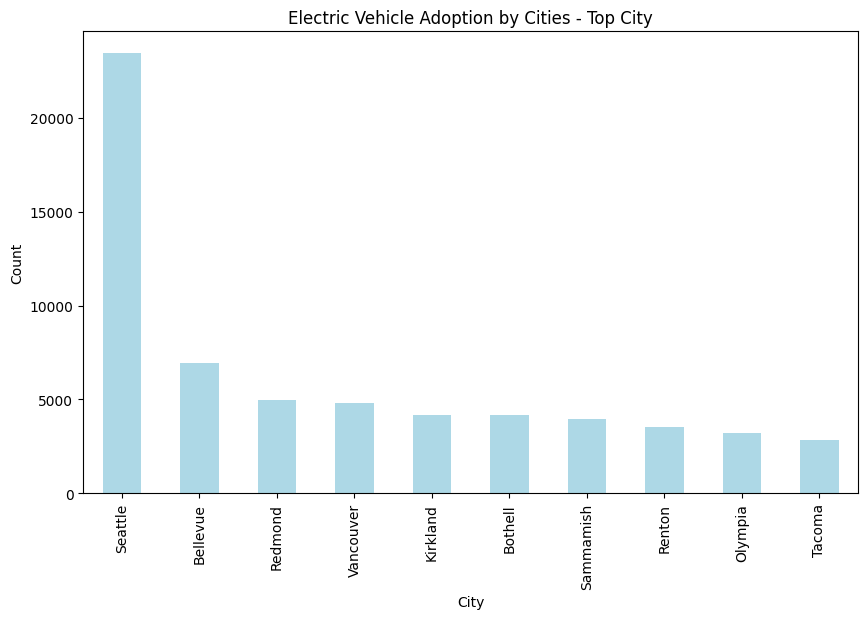

In [17]:
plt.figure(figsize=(10, 6))
city_car_count[:10].plot(kind='bar',color='lightblue')
plt.xlabel("City")
plt.ylabel("Count")
plt.title("Electric Vehicle Adoption by Cities - Top City")
plt.show()

In [18]:
type(city_car_count)

pandas.core.series.Series

<ipython-input-19-c71b955ff99c>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(city_car_count)


<Axes: xlabel='City', ylabel='Density'>

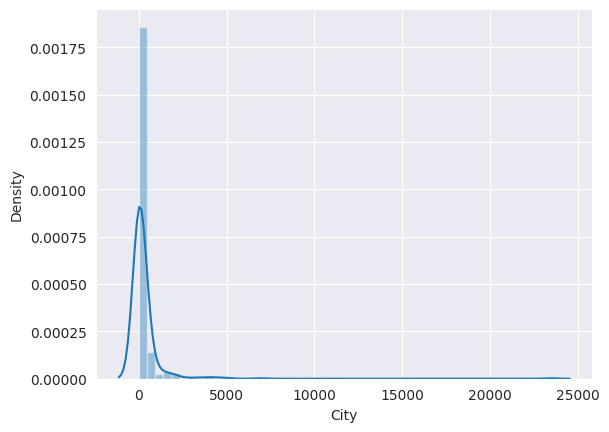

In [19]:
import seaborn as sns
sns.set_style('darkgrid')
sns.distplot(city_car_count)

cities having no of Electric Vehicle more than 1000

In [20]:
high_car_city=city_car_count[city_car_count>1000]
low_car_city=city_car_count[city_car_count<1000]
len(high_car_city)

29

In [21]:
(len(high_car_city)/len(data.City))

0.00021565507086871813

<ipython-input-22-bc81ce943fd2>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(high_car_city)


<Axes: xlabel='City', ylabel='Density'>

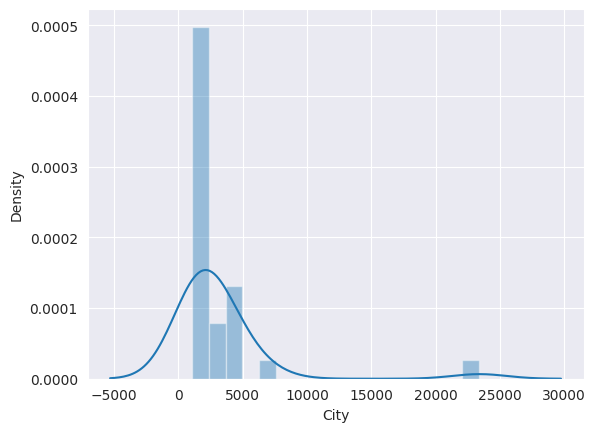

In [22]:
sns.distplot(high_car_city)

<ipython-input-23-b8649264c498>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(low_car_city)


<Axes: xlabel='City', ylabel='Density'>

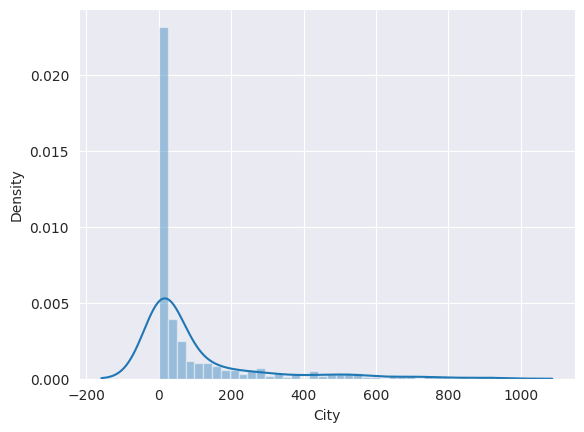

In [23]:
sns.distplot(low_car_city)

cities having no of Electric Vehicle exactly equal to 1

In [24]:
len(city_car_count[city_car_count==1])

51

##BRAND
In our analysis, we will examine the top electric vehicle brands present in the dataset. By analyzing the "Make" column, we will determine the count of vehicles associated with each brand. The dataset encompassed a variety of electric vehicle brands, but we will focus on identifying the most prominent brands based on their frequency of occurrence.

In [25]:
brand=data.Make.value_counts()

In [26]:
brand[:10]

TESLA         61650
NISSAN        13138
CHEVROLET     11417
FORD           6876
BMW            5881
KIA            5484
TOYOTA         4857
VOLKSWAGEN     3518
VOLVO          2965
AUDI           2720
Name: Make, dtype: int64

The bar plot illustrates the count of electric vehicles for each of the top 10 brands

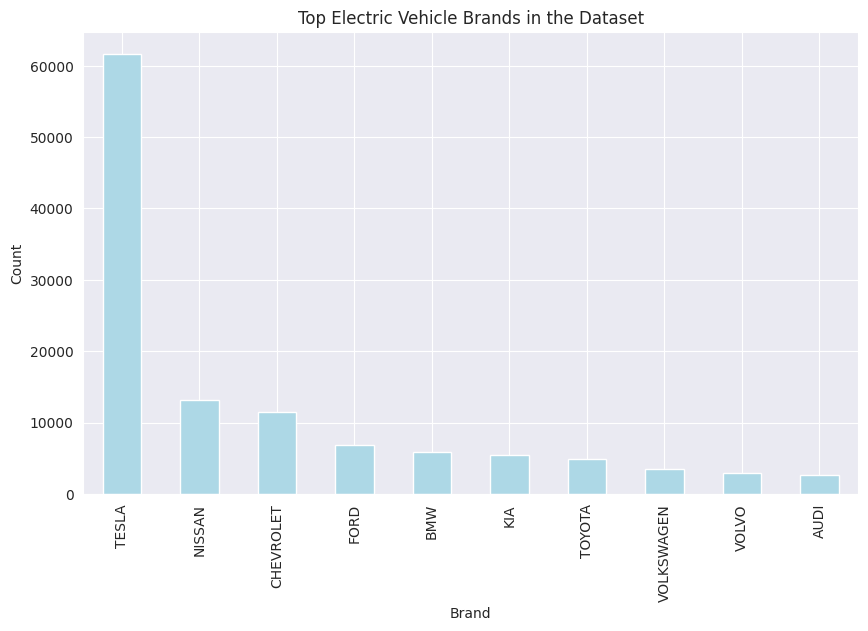

In [27]:
plt.figure(figsize=(10, 6))
brand[:10].plot(kind='bar',color='lightblue')
plt.xlabel("Brand")
plt.ylabel("Count")
plt.title("Top Electric Vehicle Brands in the Dataset")
plt.show()

##Electric Vehicle Adoption Trends by Year
In our analysis, we will examine the adoption trends of electric vehicles based on the year of their model release. By analyzing the dataset, we identified the number of electric vehicles registered in each model year. The dataset spans from 1997 to 2024, capturing the historical and recent trends in electric vehicle adoption.

In [28]:
data["Model Year"].value_counts().sort_index()

1997        1
1998        1
1999        4
2000        9
2002        2
2003        1
2008       19
2010       23
2011      815
2012     1655
2013     4589
2014     3588
2015     4910
2016     5676
2017     8557
2018    14314
2019    10555
2020    11119
2021    18478
2022    27919
2023    22209
2024       30
Name: Model Year, dtype: int64

The line plot shows the trend of electric vehicle adoption over the years

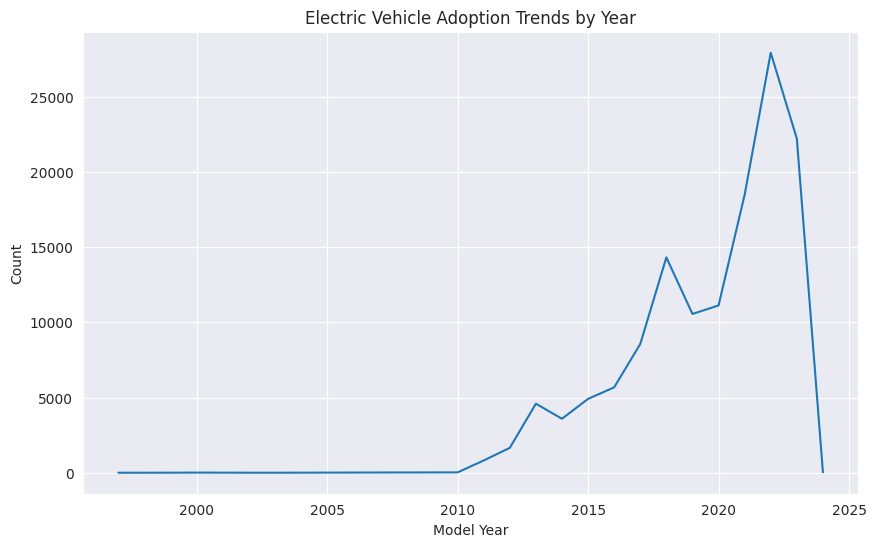

In [29]:
car_by_year=data["Model Year"].value_counts().sort_index()
plt.figure(figsize=(10, 6))
car_by_year.plot(kind='line')
plt.xlabel("Model Year")
plt.ylabel("Count")
plt.title("Electric Vehicle Adoption Trends by Year")
plt.show()

##Electric Vehicle Types adopted by market
In our analysis of the dataset, we will examine the distribution of electric vehicle types adopted by the market. We identified two main categories of electric vehicles:Battery Electric Vehicles (BEVs) and Plug-in Hybrid Electric Vehicles (PHEVs)

In [30]:
ev_type=data["Electric Vehicle Type"].value_counts()
ev_type

Battery Electric Vehicle              103424
Plug-in Hybrid Electric Vehicle        31050
Name: Electric Vehicle Type, dtype: int64

By visualizing the distribution using a pie chart, we gain a clearer understanding of the proportion of each electric vehicle type in the market

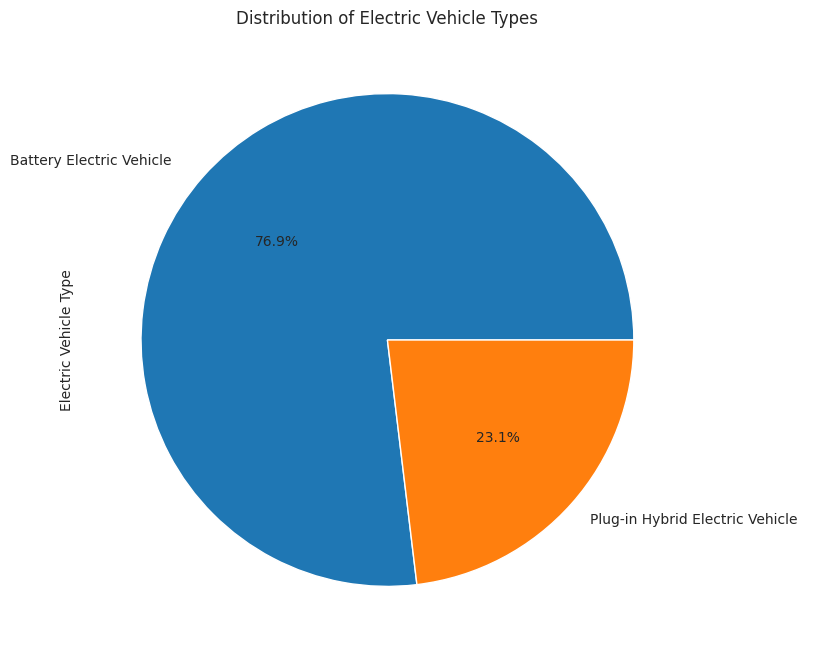

In [31]:
plt.figure(figsize=(8, 8))
ev_type.plot(kind='pie', autopct='%1.1f%%')
plt.title("Distribution of Electric Vehicle Types")
plt.show()

##CAFV
"CAFV" stands for "Clean Alternative Fuel Vehicle Eligible." It is a designation that indicates whether a vehicle qualifies for specific incentives, benefits, or programs based on its use of clean or alternative fuels. In our analysis of the dataset, we found the percentage distribution of vehicle of following category:
Clean Alternative Fuel Vehicle Eligible,Eligibility Unknown and Not Eligible due to Low Battery Range.                   

In [32]:
cavf=data["CAFV"].value_counts()
cavf

Clean Alternative Fuel Vehicle Eligible                         61082
Eligibility unknown as battery range has not been researched    56618
Not eligible due to low battery range                           16774
Name: CAFV, dtype: int64

The pie chart represents the distribution of Clean Alternative Fuel Vehicle Eligibility within the dataset

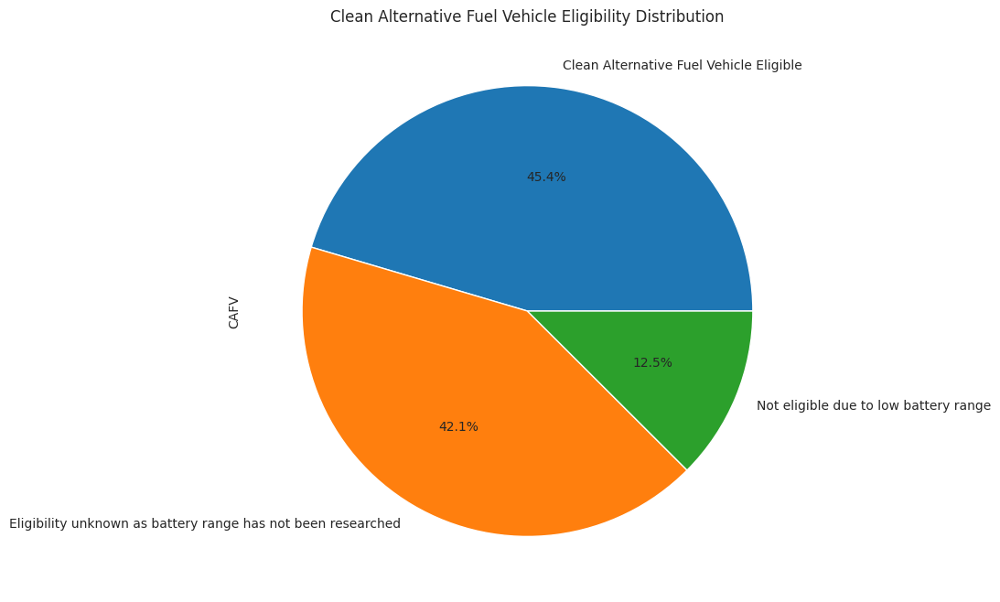

In [33]:
plt.figure(figsize=(8, 8))
cavf.plot(kind='pie', autopct='%1.1f%%')
plt.title("Clean Alternative Fuel Vehicle Eligibility Distribution")
plt.show()

##Electric Range of Electric Vehicles
 The term "electric range" refers to the distance or the maximum range that an electric vehicle (EV) can travel on a fully charged battery before it needs to be recharged. It represents the total driving distance an EV can cover solely using the energy stored in its battery pack.  In our analysis of the dataset,we will find out the Max,Min,Average range.

In [34]:
max_range=data["Electric Range"].max()
min_range=data["Electric Range"].min()
avg_range=data["Electric Range"].mean()
range=pd.DataFrame({
    "Max":[max_range],
    "Min":[min_range],
    "Average":[avg_range]
})

In [35]:
range

,Max,Min,Average
0,337,0,74.730208


Analysis of Electric Range Statistics by City

In [36]:
grouped_cities = data.groupby("City")
city_stats = grouped_cities["Electric Range"].agg(["min", "max", "mean"])


In [37]:
city_stats

,min,max,mean
City,,,
Aberdeen,0,293,76.151261
Acme,19,238,102.000000
Addy,0,25,12.500000
Airway Heights,0,322,95.650000
Alderdale,0,0,0.000000
...,...,...,...
Yacolt,0,289,59.212121
Yakima,0,330,68.377551
Yarrow Point,0,330,105.317829


##Geographical Distribution
Analyzing the geographical distribution can provide insights into the concentration and spread of electric vehicles across different regions or cities.To examine the geographical distribution, we will utilize the latitude and longitude coordinates available in the dataset.

In [38]:
data.Longitude

0        -122.913102
1        -122.359364
2        -122.091505
3        -122.329815
4        -122.375070
             ...    
134469   -122.201905
134470   -122.286460
134471   -122.583545
134472   -119.555130
134473   -122.639265
Name: Longitude, Length: 134474, dtype: float64

In [39]:
data.latitude

0         47.013593
1         47.979655
2         47.915555
3         47.579810
4         47.808070
            ...    
134469    47.613850
134470    47.476130
134471    47.323449
134472    47.319360
134473    47.537300
Name: latitude, Length: 134474, dtype: float64

Using data visualization libraries like Matplotlib or Seaborn to create scatter plots or heatmaps. Scatter plots display individual data points (vehicles) on a map based on their latitude and longitude coordinates. This allows us to observe the spatial pattern of electric vehicle distribution

<Axes: xlabel='Longitude', ylabel='latitude'>

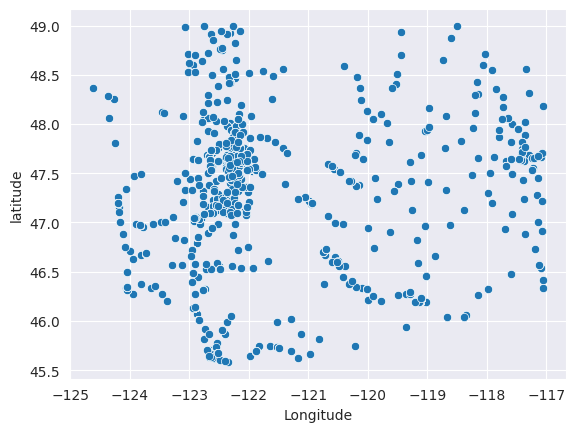

In [40]:
sns.scatterplot(x=data.Longitude,y=data.latitude)

Plotting distribution using Folium ; a Python library that provides a simple and intuitive way to create interactive maps and visualizations.

In [41]:
import folium
from folium import Map
from folium import Marker
from random import choice

In [42]:
lat, lon = data.latitude[0], data.Longitude[0]
lat, lon

(47.0135926, -122.9131017)

Plotting 1 city with the help of latitude and longitude


In [43]:
map=folium.Map()
marker=folium.Marker((lat,lon))
marker.add_to(map)
map

Plotting some cities on the map

In [44]:
from folium import Map, Marker, Icon
from random import choice

# Create a sample dataset
sample_size = 5000
sample_data = data.sample(sample_size)

# Create a map
data_map = Map(location=[47.5, -121], zoom_start=7)

# Define a list of marker colors
marker_colors = ['red', 'blue', 'green', 'orange', 'purple']

# Add markers to the map
for index, row in sample_data.iterrows():
    popup = '{}/{}/{}'.format(row['Model Year'], row['Make'], row['Model'])

    # Choose a random marker color
    marker_color = choice(marker_colors)

    # Create a marker with the chosen color
    marker = Marker([row['latitude'], row['Longitude']], popup=popup, icon=Icon(color=marker_color))

    # Add the marker to the map
    marker.add_to(data_map)

# Display the map
data_map


HEAT MAP:
 Heatmaps provide a more aggregated view by representing the density of electric vehicles in specific areas.

In [45]:
from folium.plugins import HeatMap

In [46]:
lat_lon_pairs=list(zip(list(data.latitude),list(data.Longitude)))

In [47]:
map=folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map